# Final Dataset Profiling - SMM08565 UECE
Scientific figures for international publication (IEEE Standard).

In [1]:
%load_ext autoreload 
%autoreload 2

import sys
import os
import pandas as pd
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pathlib
from matplotlib.patches import ConnectionPatch
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import ListedColormap
from dataclasses import dataclass, field
from typing import Optional, Union, List, Dict, Any
from sklearn.base import BaseEstimator
from sklearn.utils.validation import check_is_fitted

# --- ROBUST ROOT DISCOVERY ---
def find_project_root(marker: str = "pyproject.toml") -> Path:
    """Locates the project root by searching upwards from the notebook location."""
    try:
        start_dir = Path(globals().get('_dh', [os.getcwd()])[0]).resolve()
    except (IndexError, NameError):
        start_dir = Path.cwd().resolve()

    current = start_dir
    for parent in [current] + list(current.parents):
        if (parent / marker).exists():
            return parent
            
    # Fallback
    fallback = Path("/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026")
    return fallback if (fallback / marker).exists() else start_dir

# Detect & Set Root
project_root = find_project_root()
if Path.cwd() != project_root:
    os.chdir(project_root)
    if str(project_root) not in sys.path:
        sys.path.append(str(project_root))

print(f"✅ Project Root: {project_root}")

✅ Project Root: /Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026


## 1. Configuration & Engine

In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt

# 1. Configurações de Tipografia (Times New Roman Regular)
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = ['Times New Roman']
mpl.rcParams['text.usetex'] = False  # Evita dependência externa de LaTeX se não necessário

# 2. Configurações de Salvamento (A Solução para as Margens)
mpl.rcParams['savefig.bbox'] = 'tight'    # Força o 'tight' em todo savefig
mpl.rcParams['savefig.pad_inches'] = 0.1   # Remove o vácuo branco residual
mpl.rcParams['savefig.dpi'] = 300          # Padroniza alta resolução para IEEE
mpl.rcParams['savefig.format'] = 'pdf'     # Define PDF como padrão de exportação

In [3]:
@dataclass(frozen=True)
class VisualizationConfig:
    DEFAULT_OUTPUT_DIR: str = "reports/figures/final"
    IEEE_STYLE: Dict[str, Any] = field(default_factory=lambda: {
        'pdf.fonttype': 42,
        'font.family': 'serif',
        'font.serif': ['Times New Roman'],
        'font.size': 10,
        'axes.labelsize': 10,
        'axes.titlesize': 11,
        'legend.fontsize': 9,
        'xtick.labelsize': 9,
        'ytick.labelsize': 9,
        'figure.dpi': 300,
        'savefig.bbox': 'tight',
        'axes.grid': False # Disabled global grid for cleaner matrices
    })

CONFIG = VisualizationConfig()

class VisualizationCore(BaseEstimator):
    def __init__(self, output_dir=CONFIG.DEFAULT_OUTPUT_DIR):
        self.output_dir = output_dir
        self.is_fitted_ = False

    def fit(self, X=None, y=None):
        self.validated_output_path_ = pathlib.Path(self.output_dir).resolve()
        self.validated_output_path_.mkdir(parents=True, exist_ok=True)
        self.style_context_ = CONFIG.IEEE_STYLE.copy()
        self.is_fitted_ = True
        return self

    def save(self, fig, filename):
        for fmt in ['pdf', 'png']:
            path = self.validated_output_path_ / f"{filename}.{fmt}"
            fig.savefig(path, format=fmt, dpi=300)

viz_core = VisualizationCore().fit()

In [4]:
import fitz  # PyMuPDF
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import numpy as np

class PanelA_Generator(VisualizationCore):
    def __init__(self, output_dir=CONFIG.DEFAULT_OUTPUT_DIR):
        super().__init__(output_dir)

    def _load_image(self, path: str):
        """Helper para carregar JPG/PNG ou converter PDF para array de imagem."""
        if path.lower().endswith('.pdf'):
            doc = fitz.open(path)
            page = doc.load_page(0)  # Carrega a primeira página
            pix = page.get_pixmap(matrix=fitz.Matrix(300/72, 300/72)) # Renderiza em 300 DPI
            img = np.frombuffer(pix.samples, dtype=np.uint8).reshape(pix.h, pix.w, pix.n)
            return img
        return mpimg.imread(path)
        
    def create(self, fortress_path, brazil_path, ceara_path):
        # 1. Carregamento e Crop Milimétrico
        img_base = self._load_image(fortress_path)
        h, w = img_base.shape[:2]
        # Crop focado para centralizar os campi e eliminar vácuos
        img_base = img_base[int(h*0.1):int(h*0.8), int(w*0.05):int(w*0.75)]
        
        with plt.style.context(self.style_context_):
            fig = plt.figure(figsize=(10, 8))
            # Eixo principal com margens para coordenadas externas
            ax = fig.add_axes([0.1, 0.1, 0.85, 0.85]) 
            ax.imshow(img_base)
            for s in ax.spines.values(): 
                s.set_linewidth(1.5)
                s.set_color('black')

            # --- 2. Insets Quadrados e Alinhados com a Borda (Esquerda) ---
            # Brasil (Topo Esquerdo - Colado na borda)
            ax_br = fig.add_axes([0.08, 0.625, 0.20, 0.20]) 
            img_br = self._load_image(brazil_path)
            bh, bw = img_br.shape[:2]

            # 1. Definimos um zoom que aproxime o continente (ex: 80% do tamanho original)
            zoom_br = 0.9 
            side_b = int(min(bh, bw) * zoom_br)

            # 2. Centralização com deslocamento para a Direita (Litoral)
            # O Brasil pende para a esquerda no mapa; para destacar o Ceará, 
            # movemos a janela de corte um pouco para a direita (start_w maior)
            start_h_br = (bh - side_b) // 2
            # Adicionamos um deslocamento (offset) de 10% da largura para a esquerda
            start_w_br = ((bw - side_b) // 2) - int(bw * 0.1) 

            # 3. Exibição com processamento para evidenciar linhas
            img_br_cropped = img_br[start_h_br : start_h_br + side_b, start_w_br : start_w_br + side_b]

            # Dica: Se as linhas estiverem sumindo, você pode aumentar o contraste 
            # ou garantir que a renderização do PDF tenha sido em 300 DPI
            ax_br.imshow(img_br_cropped)
            ax_br.set_xticks([]), ax_br.set_yticks([])
            for s in ax_br.spines.values(): s.set_linewidth(1.2)

            # Ceará (Abaixo do Brasil - Sem gap e com novo recorte/zoom)
            ax_ce = fig.add_axes([0.08, 0.425, 0.20, 0.20])
            img_ce = self._load_image(ceara_path)
            zoom_factor = 0.3  # Quanto menor, mais próximo (0.6 = 40% de zoom em relação ao original)
            ch, cw = img_ce.shape[:2]
            side_c = int(min(ch, cw) * zoom_factor)

            # Cálculo do centro para manter o foco no meio da imagem
            start_h = max(0, ((ch - side_c) // 2) - int(ch * 0.25))
            start_w = (cw - side_c) // 2

            # Exibição com o recorte mais próximo
            ax_ce.imshow(img_ce[start_h : start_h + side_c, start_w : start_w + side_c])
            ax_ce.set_xticks([]), ax_ce.set_yticks([])
            for s in ax_ce.spines.values(): s.set_linewidth(1.2)

            # --- 3. Coordenadas no Topo e Esquerda (Externas) ---
            ax.xaxis.tick_top()
            ax.set_xticks([int(w*0.15), int(w*0.45)])
            ax.set_xticklabels(["38.55°W", "38.45°W"], family='Times New Roman')
            ax.set_yticks([int(h*0.3), int(h*0.6)])
            ax.set_yticklabels(["3.72°S", "3.78°S"], family='Times New Roman')
            ax.tick_params(axis='both', direction='out', length=6, pad=8)

            # --- 4. Bloco Técnico Compacto (Escala + Rosa dos Ventos) ---
            # Reduzimos o tamanho total do bloco para ser menos intrusivo
            rect_bg = patches.Rectangle((0.01, 0.01), 0.22, 0.12, transform=ax.transAxes, 
                                        facecolor='white', edgecolor='black', lw=1, alpha=1.0, zorder=10)
            ax.add_patch(rect_bg)
            
            # Escala Binária (0-200-400 m)
            ax.add_patch(patches.Rectangle((0.03, 0.03), 0.08, 0.02, transform=ax.transAxes, 
                                           facecolor='black', zorder=11))
            ax.add_patch(patches.Rectangle((0.11, 0.03), 0.08, 0.02, transform=ax.transAxes, 
                                           facecolor='white', edgecolor='black', zorder=11))
            
            # Labels da Escala
            ax.text(0.03, 0.06, "0", transform=ax.transAxes, ha='center', fontsize=8, family='Times New Roman', zorder=12)
            ax.text(0.11, 0.06, "200", transform=ax.transAxes, ha='center', fontsize=8, family='Times New Roman', zorder=12)
            ax.text(0.19, 0.06, "400 m", transform=ax.transAxes, ha='center', fontsize=8, family='Times New Roman', zorder=12)
            
            # Rosa dos Ventos Estilizada (Acima do '200' com respiro)
            # Triângulos Preto e Branco para efeito de bússola
            cx, cy = 0.11, 0.10  # Centralizado acima do 200
            rw, rh = 0.015, 0.025
            ax.add_patch(patches.Polygon([[cx, cy+rh], [cx, cy], [cx-rw, cy-rh/3]], 
                                         fc='black', ec='black', transform=ax.transAxes, zorder=13))
            ax.add_patch(patches.Polygon([[cx, cy+rh], [cx, cy], [cx+rw, cy-rh/3]], 
                                         fc='white', ec='black', transform=ax.transAxes, zorder=13))

            # --- 5. Legenda com Hierarquia de Fonte ---
            legend_elements = [
                Line2D([0], [0], marker='o', color='none', label='UECE Tower',
                       markerfacecolor='red', markersize=6, markeredgewidth=0),
                Line2D([0], [0], marker='s', color='none', label='LASP UFC',
                       markerfacecolor='#00BFFF', markersize=6, markeredgewidth=0)
            ]
            
            leg = ax.legend(handles=legend_elements, loc='lower right', 
                            title='Study Sites', frameon=True, borderpad=0.5,
                            prop={'family': 'Times New Roman', 'size': 10})
            
            # Ajuste de Hierarquia: Título maior que os itens
            leg.get_title().set_family('Times New Roman')
            leg.get_title().set_size(12)
            leg.get_frame().set_alpha(1.0)
            leg.get_frame().set_edgecolor('black')

            return fig

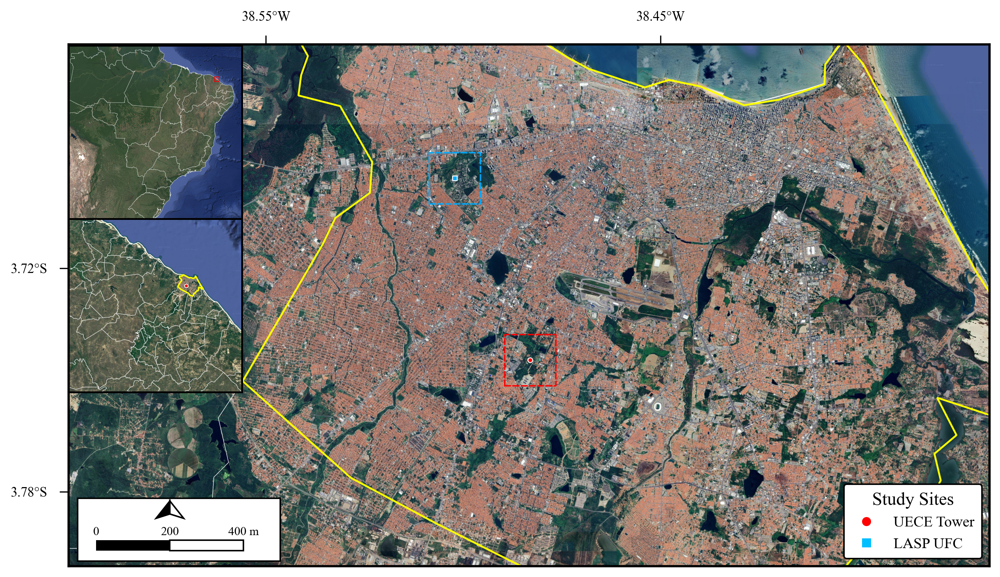

In [11]:
paths = {
    'fortaleza': '/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026/reports/figures/raw/Figure Study Data/Figure1(a)_FortalezaMap.pdf',
    'brasil': '/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026/reports/figures/raw/Figure Study Data/Figure1(a)_BrasilMap.pdf',
    'ceara': '/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026/reports/figures/raw/Figure Study Data/Figure1(a)_CearaMap.pdf',
    'uece_map': '/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026/reports/figures/raw/Figure Study Data/Figure1(a)_UECEMap.pdf',
    'panorama': '/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026/reports/figures/raw/Figure Study Data/UECE_meteriological-base.jpg',
    'recorder': '/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026/reports/figures/raw/Figure Study Data/UECE_recorder.jpg',
}

p1 = PanelA_Generator().fit()
fig1 = p1.create(paths['fortaleza'], paths['brasil'], paths['ceara'])
plt.show(fig1)
p1.save(fig1, "panel_fortaleza")

In [4]:
import fitz  # PyMuPDF
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import numpy as np

class PanelB_Generator(VisualizationCore):
    def __init__(self, output_dir=CONFIG.DEFAULT_OUTPUT_DIR):
        super().__init__(output_dir)

    def _load_image(self, path: str):
        """Helper para carregar JPG/PNG ou converter PDF para array de imagem."""
        if path.lower().endswith('.pdf'):
            doc = fitz.open(path)
            page = doc.load_page(0)  # Carrega a primeira página
            pix = page.get_pixmap(matrix=fitz.Matrix(300/72, 300/72)) # Renderiza em 300 DPI
            img = np.frombuffer(pix.samples, dtype=np.uint8).reshape(pix.h, pix.w, pix.n)
            return img
        return mpimg.imread(path)
    
    def create(self, setup_path, recorder_path):
        with plt.style.context(self.style_context_):
            # 1. Configuração da Figura (Panorama)
            # A proporção 10:5 costuma ser ideal para panoramas sem espremer
            fig = plt.figure(figsize=(10, 5))
            ax = fig.add_axes([0, 0, 1, 1])
            
            img_setup = self._load_image(setup_path)
            sh, sw = img_setup.shape[:2]
            ax.imshow(img_setup, aspect='equal')
            
            # --- 1. CONTROLE DO INSET (FOTO DO GRAVADOR) ---
            ins_w, ins_h = 0.35, 0.35 # Tamanho do quadro
            ins_x, ins_y = 0.325, 0.60 # Posição na figura (0 a 1)
            
            ax_ins = fig.add_axes([ins_x, ins_y, ins_w, ins_h])
            img_rec = self._load_image(recorder_path)
            rh, rw = img_rec.shape[:2]

            # AJUSTE DE RECORTE (PIXELS)
            px_center, py_center = rw // 2, int(rh * 0.65)
            c_side = int(min(rh, rw) * 0.6)
            
            img_crop = img_rec[py_center-c_side//2 : py_center+c_side//2, 
                               px_center-c_side//2 : px_center+c_side//2]
            ax_ins.imshow(img_crop, aspect='equal')
            
            # Moldura do Inset
            for s in ax_ins.spines.values(): s.set_linewidth(1.5)
            ax_ins.set_xticks([]), ax_ins.set_yticks([])

            # --- 2. CONTROLE DO RETÂNGULO (PIXELS NA PANORÂMICA) ---
            # Defina exatamente onde o retângulo começa e termina na imagem original
            target_x_start = int(sw * 0.18) 
            target_y_start = int(sh * 0.47) # Topo do gravador na torre
            target_width   = int(sw * 0.03)
            target_height  = int(sh * 0.08)

            # Conversão para coordenadas do Matplotlib (0 a 1)
            rx = target_x_start / sw
            ry = (sh - target_y_start - target_height) / sh # Inverte Y pois imshow começa no topo
            rw_f = target_width / sw
            rh_f = target_height / sh

            rect = patches.Rectangle((rx, ry), rw_f, rh_f, transform=ax.transAxes, 
                                     fill=False, edgecolor='red', lw=2, linestyle='--')
            ax.add_patch(rect)

            # --- 3. CONTROLE TOTAL DAS LINHAS (COORDENADAS DA FIGURA) ---
            # Ponto de Partida (Direita do Retângulo)
            x_start = rx + rw_f
            y_top_start = ry + rh_f
            y_bot_start = ry

            # Ponto de Chegada (Esquerda do Inset)
            x_end = 0.42
            y_top_end = ins_y + ins_h
            y_bot_end = ins_y

            # Linha Superior
            l_sup = Line2D([x_start, x_end], [y_top_start, y_top_end], 
                           transform=fig.transFigure, color='red', linestyle='--', lw=1.2)
            
            # Linha Inferior
            l_inf = Line2D([x_start, x_end], [y_bot_start, y_bot_end], 
                           transform=fig.transFigure, color='red', linestyle='--', lw=1.2)
            
            fig.lines.extend([l_sup, l_inf])

            # --- 4. Legenda Unificada (Padrão Painel A) ---
            # Bloco único no canto inferior direito, Times New Roman, Opaco
            legend_elements = [
                Line2D([0], [0], color='none', label='Recording Site', 
                       markerfacecolor='none', markersize=0),
                Line2D([0], [0], marker='o', color='none', label='SMM08565 Recorder',
                       markerfacecolor='red', markersize=6, markeredgewidth=0)
            ]
            
            leg = ax.legend(handles=legend_elements, loc='lower right', 
                            frameon=True, borderpad=0.8, handletextpad=0.5)
            
            # Forçando estilo Times New Roman e opacidade
            leg.get_frame().set_alpha(1.0)
            leg.get_frame().set_edgecolor('black')
            leg.get_frame().set_boxstyle("square,pad=0.2")
            
            for text in leg.get_texts():
                text.set_fontfamily('serif')
                text.set_name('Times New Roman')
                text.set_size(10)
            
            # Ajuste específico para o título da legenda (Recording Site)
            leg.get_texts()[0].set_weight('bold')
            leg.get_texts()[0].set_size(11)

            # 5. Moldura Principal
            for s in ax.spines.values():
                s.set_linewidth(2)
            ax.set_xticks([]), ax.set_yticks([])
            
            return fig

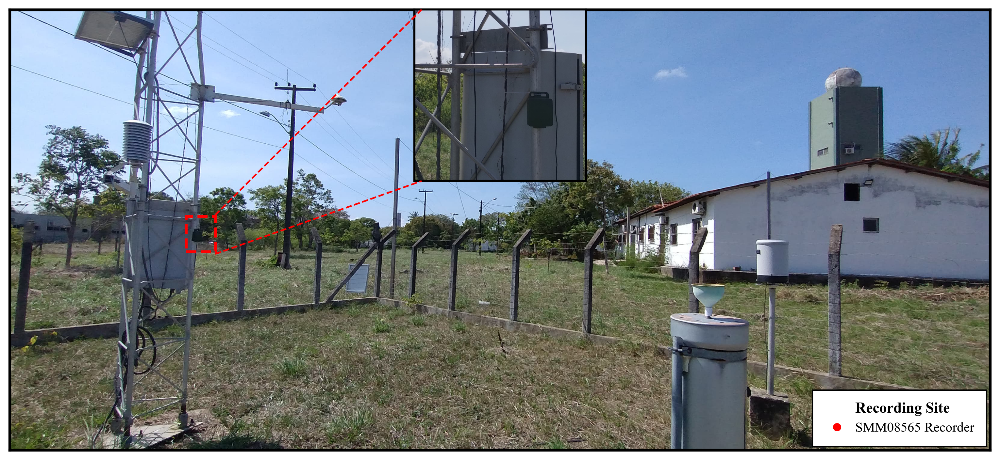

In [5]:
paths = {
    'panorama': '/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026/reports/figures/raw/Figure Study Data/UECE_meteriological-base.jpg',
    'recorder': '/Users/fabiomachadomilan/Documents/GitHub/Rainfall-opensense_2026/reports/figures/raw/Figure Study Data/UECE_recorder.jpg',
}

p2 = PanelB_Generator().fit()
fig2 = p2.create(paths['panorama'], paths['recorder'])
plt.show(fig2)
p2.save(fig2, "panel_recorder")